In [ ]:
# import os
# #os.chdir(r'/content/')

# !tar -czf weights.tar.gz /content/de_makeup_155_epoch.h5
# from IPython.display import FileLink

# FileLink(r'weights.tar.gz')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Setup 

In [ ]:
!pip install -q -U "tensorflow-text==2.8.*"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 42.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 498.0/498.0 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.3/462.3 KB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 39.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 69.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 KB 2.3 MB/s eta 0:00:00


In [ ]:
!pip install -q tf-models-official==2.7.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 45.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.1/352.1 KB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 KB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.9/238.9 KB 27.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 KB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 77.2 MB/s eta 0:00:00


In [ ]:
!pip install -q tensorflow_addons

In [ ]:
!pip install -q -U --no-cache-dir gdown --pre

In [ ]:
!gdown -q --no-cookies 1f_BAk6dzyXW5MX4E8S0OMWV1k1mqef1X
# # https://drive.google.com/file/d/1yvbsBWKGB-Gaowz0EVZimtEh-dWGXf9n/view?usp=share_link
#!gdown --no-cookies --id 1yvbsBWKGB-Gaowz0EVZimtEh-dWGXf9n

In [ ]:
!unzip -qq /content/demake_up_data.zip

In [ ]:
#!wget https://www.dropbox.com/s/uhv7x97olzpq1jt/de_makeup_155_epoch.h5

## Import Module/Library

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model
import tensorflow_addons as tfa

/usr/local/lib/python3.8/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.9.0 and strictly below 2.12.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.4 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


In [ ]:
tf.__version__

'2.8.4'

## Config Parameters

In [ ]:
BATCH_SIZE = 32
IMG_HEGIHT  = 224
IMG_WIDHT   = 224

IMG_CHANNEL = 3
BUFFER_SIZE = BATCH_SIZE*10

IMG_PATH = "./demake_up_data"
np.random.seed(45)

##  Load Data

In [ ]:
def load(image_file):
    makeup_img_file, non_img_file =  tf.split(image_file,2)
    
    makeup_img = tf.io.read_file(makeup_img_file[0])
    makeup_img = tf.image.decode_jpeg(makeup_img,channels=IMG_CHANNEL)
    
    non_img = tf.io.read_file(non_img_file[0])
    non_img = tf.image.decode_jpeg(non_img,channels=IMG_CHANNEL)

    # Convert both images to float32 tensors
    makeup_img  = tf.cast(makeup_img, tf.float32)
    non_img = tf.cast(non_img, tf.float32)
    
    return makeup_img, non_img

(224, 224, 3)
(224, 224, 3)


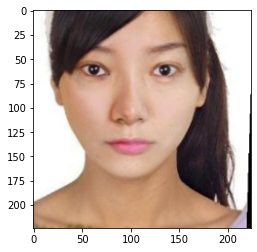

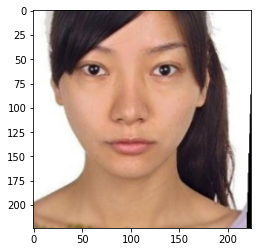

In [ ]:
makeup_img, non_img = load([str(IMG_PATH + '/train/makeup/0.png'),
                                    str(IMG_PATH + '/train/non-makeup/0.png')])
print(makeup_img.shape)
print(non_img.shape)



# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(makeup_img/255.0)
plt.figure()
plt.imshow(non_img/255.0)


In [ ]:
@tf.function()
def random_flip(makeup_img, non_img):
    if tf.random.uniform(()) > 0.5:
        # Random mirroring
        makeup_img = tf.image.flip_left_right(makeup_img)
        non_img = tf.image.flip_left_right(non_img)

    return makeup_img, non_img


def processing_image(makeup_img, non_img):
    makeup_img = (makeup_img / 255.0)
    non_img = (non_img / 255.0)
    
    return makeup_img, non_img


def load_image_train(image_file):
    makeup_img, non_img = load(image_file)
    makeup_img, non_img = random_flip(makeup_img, non_img)
    makeup_img, non_img = processing_image(makeup_img, non_img)

    return makeup_img, non_img


def load_image_val(image_file):
    makeup_img, non_img = load(image_file)
    makeup_img, non_img = processing_image(makeup_img, non_img)

    return makeup_img, non_img 

In [ ]:
def prep_data(path):
    makeup_img_list = [os.path.join(path, f) for f in os.listdir(path)]
    data_list = [[i, i.replace('makeup','non-makeup')] for i in makeup_img_list]
    return data_list

train_data_list = prep_data(str(IMG_PATH + '/train/makeup/'))
val_data_list = prep_data(str(IMG_PATH + '/val/makeup/'))
test_data_list = prep_data(str(IMG_PATH + '/test/makeup/'))

np.random.shuffle(train_data_list)
np.random.shuffle(val_data_list)
np.random.shuffle(test_data_list)

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_data_list)
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

val_dataset = tf.data.Dataset.from_tensor_slices(val_data_list)
val_dataset = val_dataset.map(load_image_val)
val_dataset = val_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.from_tensor_slices(test_data_list)
test_dataset = test_dataset.map(load_image_val)
test_dataset = test_dataset.batch(BATCH_SIZE)


## Build Model 

In [ ]:
def identity_block(x, filter):
    # copy tensor to variable called x_skip
    x_skip = x
    # Layer 1
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    # Layer 2
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = tfa.layers.InstanceNormalization()(x)
    # Add Residue
    #x = tf.keras.layers.Add()([x, x_skip])    
    x = tf.keras.layers.concatenate([x, x_skip], axis=-1)
    x = tf.keras.layers.Activation('gelu')(x)
    return x

def convolutional_block(x, filter):
    # copy tensor to variable called x_skip
    x_skip = x
    # Layer 1
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same', strides = (2,2))(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    # Layer 2
    x = tf.keras.layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = tfa.layers.InstanceNormalization()(x)
    # Processing Residue with conv(1,1)
    x_skip = tf.keras.layers.Conv2D(filter, (1,1), strides = (2,2))(x_skip)
    # Add Residue
    #x = tf.keras.layers.Add()([x, x_skip])
    x = tf.keras.layers.concatenate([x, x_skip], axis=-1)
    x = tf.keras.layers.Activation('gelu')(x)
    return x

In [ ]:
def build_model(input_shape=(224, 224, 3)):
    # Encoder
    skips = []
    # Step 1 (Setup Input Layer)
    x_input = tf.keras.layers.Input(input_shape)
    #x = tf.keras.layers.ZeroPadding2D((3, 3))(x_input)
    # Step 2 (Initial Conv layer along with maxPool)
    x = tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same')(x_input)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    skips.append(x)
    x = tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding='same')(x)
    # Define size of sub-blocks and initial filter size
    block_layers = [5, 6, 8, 5]

    filter_size = 64
    # Step 3 Add the Resnet Blocks
    for i in range(4):
        if i == 0:
            # For sub-block 1 Residual/Convolutional block not needed
            for j in range(block_layers[i]):
                x = identity_block(x, filter_size)
        else:
            # One Residual/Convolutional Block followed by Identity blocks
            # The filter size will go on increasing by a factor of 2
            filter_size = filter_size*2
            x = convolutional_block(x, filter_size)
            for j in range(block_layers[i] - 1):
                x = identity_block(x, filter_size)
        
        skips.append(x)

        
    # print(len(skips))
    # for skip in skips:
    #   print(skip.shape)

    skip_layer_input = skips.pop()
    # Decoder
    x = tf.keras.layers.Conv2DTranspose(256, (2,2),strides=(2,2),padding='same')(x)
    skip_layer_input = skips.pop()
    merge = tf.keras.layers.concatenate([x, skip_layer_input], axis=-1)
    x = tf.keras.layers.Conv2D(256, 3, padding='same')(merge)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    x = tf.keras.layers.Conv2D(256, 3,  activation='gelu',padding='same')(x)


    x = tf.keras.layers.Conv2DTranspose(128, (2,2),strides=(2,2),padding='same')(x)
    skip_layer_input = skips.pop()
    merge = tf.keras.layers.concatenate([x, skip_layer_input], axis=-1)
    x = tf.keras.layers.Conv2D(128, 3, padding='same')(merge)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    x = tf.keras.layers.Conv2D(128, 3, activation='gelu', padding='same')(x)


    x = tf.keras.layers.Conv2DTranspose(64, (3,3),strides=(2,2),padding='same')(x)
    skip_layer_input = skips.pop()
    merge = tf.keras.layers.concatenate([x, skip_layer_input], axis=-1)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(merge)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    x = tf.keras.layers.Conv2D(64,3, activation='gelu',padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(64, (2,2),strides=(2,2),padding='same')(x)
    skip_layer_input = skips.pop()
    merge = tf.keras.layers.concatenate([x, skip_layer_input], axis=-1)
    x = tf.keras.layers.Conv2D(64, 3, padding='same')(merge)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    x = tf.keras.layers.Conv2D(64, 3, activation='gelu', padding='same')(x)

    x = tf.keras.layers.Conv2DTranspose(3,(2,2),strides=(2,2),padding='same')(x)
    x = tf.keras.layers.Conv2D(3, 3, padding='same')(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.Activation('gelu')(x)
    x = tf.keras.layers.Conv2D(3,3, activation='gelu',padding='same')(x)


    model = tf.keras.models.Model(inputs = x_input, outputs = x, name = "ResNet34_Unet")

    return model


In [ ]:
# res34Unet = build_model(input_shape=(IMG_HEGIHT, IMG_WIDHT, IMG_CHANNEL))
# res34Unet.summary()

In [ ]:
res34Unet = tf.keras.models.load_model('/content/drive/MyDrive/de_makeup_100epochs_26snr_epoch.h5')

## Config and Compile Model

### Show Generated Images and Evaluation Function

In [ ]:
def evaluate(model, epoch, dataset):  
    psnr_non_mean = 0.0
    psnr_sr_mean = 0.0
    count = 0
    for makeup_img, non_img in dataset:
        pred_non = model([makeup_img], training=False)
        psnr_non = tf.image.psnr(pred_non, non_img, max_val=1.0)
        __psnr_non_mean = tf.math.reduce_mean(psnr_non)
        psnr_non_mean += __psnr_non_mean
        count =count + 1
    psnr_non_mean = psnr_non_mean/count
    print('-------- psnr_non: ', psnr_non_mean.numpy(), '----- epoch: ', epoch, '  count: ', count)
    
    return psnr_non_mean
    

def generate_images(model, makeup_img, non_img):
    pred_non = model([makeup_img], training=False)
    plt.figure(figsize=(15,20))
    display_list = [makeup_img[0], non_img[0], pred_non[0]]
    title = ['Input', 'Non-makeup', 'Predicted']    

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

### Optimizer

In [ ]:
EPOCHS = 50

from official.nlp import optimization  # to create AdamW optimizer
steps_per_epoch = tf.data.experimental.cardinality(train_dataset).numpy()
num_train_steps = steps_per_epoch * EPOCHS
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 1e-2
generator_optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

## Training

In [ ]:

@tf.function
def train_step(model, makeup_img, non_img):
    with tf.GradientTape() as tape:
        # output
        pred_non = model([makeup_img], training=True)     
        loss = tf.reduce_mean(tf.square(pred_non-non_img))*100
        
    generator_gradients = tape.gradient(loss, model.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients, model.trainable_variables))
    
    return loss

    
def fit(model, train_ds, epochs, val_ds):
    best_pnsr = 0.0
    step_counter = 0
    for epoch in range(epochs):
        # Train
        total_loss = 0.0
        for makeup_img, non_img in train_ds:
            loss = train_step(model, makeup_img, non_img)
            total_loss = total_loss + loss
            step_counter += 1
        total_loss = total_loss/step_counter
        print('epoch: {}   loss: {}'.format(epoch, total_loss))
        
        pnsr = evaluate(model, epoch, val_ds)     
        if best_pnsr < pnsr:
            best_pnsr = pnsr
            
            for makeup_img, non_img in val_ds.take(1):
                generate_images(model, makeup_img, non_img)


epoch: 0   loss: 0.06666180491447449
-------- psnr_non:  25.816357 ----- epoch:  0   count:  16


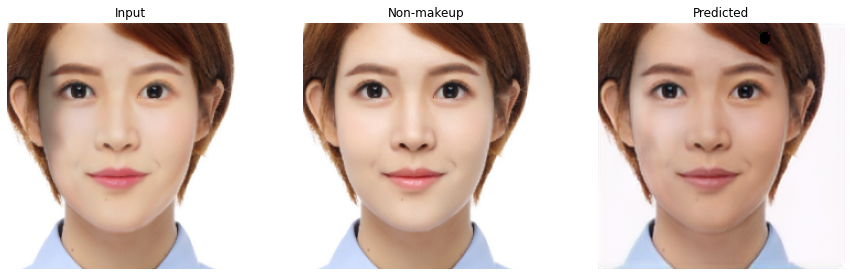

epoch: 1   loss: 0.04633702337741852
-------- psnr_non:  25.02559 ----- epoch:  1   count:  16
epoch: 2   loss: 0.04416858032345772
-------- psnr_non:  25.60298 ----- epoch:  2   count:  16
epoch: 3   loss: 0.03737253695726395
-------- psnr_non:  24.915037 ----- epoch:  3   count:  16
epoch: 4   loss: 0.06928496807813644
-------- psnr_non:  22.129772 ----- epoch:  4   count:  16
epoch: 5   loss: 0.0739937573671341
-------- psnr_non:  24.413023 ----- epoch:  5   count:  16
epoch: 6   loss: 0.04177119955420494
-------- psnr_non:  24.176128 ----- epoch:  6   count:  16
epoch: 7   loss: 0.028655312955379486
-------- psnr_non:  24.91388 ----- epoch:  7   count:  16
epoch: 8   loss: 0.0248838160187006
-------- psnr_non:  25.375303 ----- epoch:  8   count:  16
epoch: 9   loss: 0.017670949921011925
-------- psnr_non:  25.402285 ----- epoch:  9   count:  16
epoch: 10   loss: 0.016278108581900597
-------- psnr_non:  25.219912 ----- epoch:  10   count:  16
epoch: 11   loss: 0.013239992782473564
-

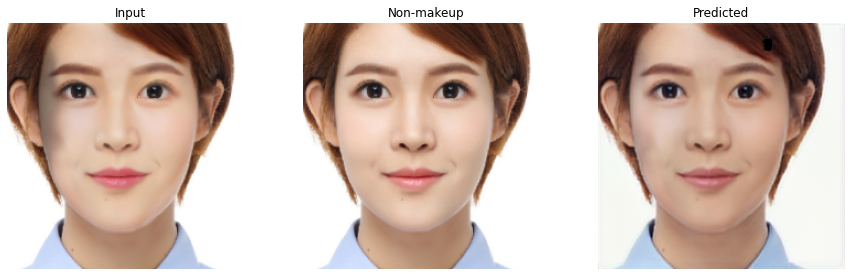

epoch: 21   loss: 0.004708787426352501
-------- psnr_non:  25.87719 ----- epoch:  21   count:  16
epoch: 22   loss: 0.004451213404536247
-------- psnr_non:  25.978743 ----- epoch:  22   count:  16


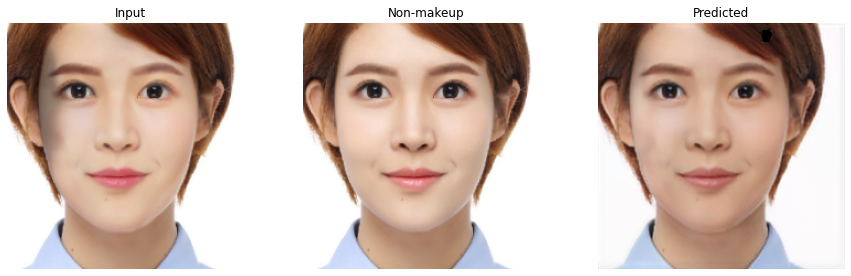

epoch: 23   loss: 0.004007951356470585
-------- psnr_non:  25.591902 ----- epoch:  23   count:  16
epoch: 24   loss: 0.0038604598958045244
-------- psnr_non:  25.489645 ----- epoch:  24   count:  16
epoch: 25   loss: 0.003825283609330654
-------- psnr_non:  25.61125 ----- epoch:  25   count:  16
epoch: 26   loss: 0.003274020506069064
-------- psnr_non:  25.988773 ----- epoch:  26   count:  16


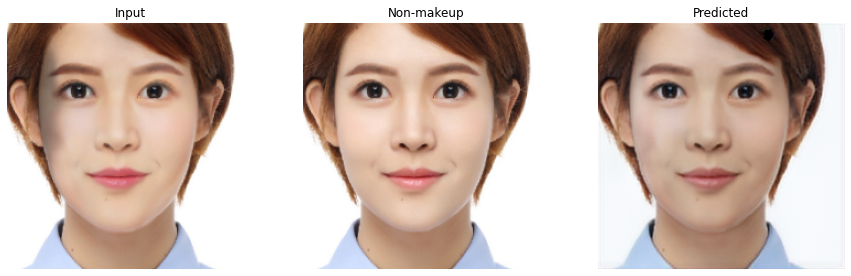

epoch: 27   loss: 0.0031200856901705265
-------- psnr_non:  25.949667 ----- epoch:  27   count:  16
epoch: 28   loss: 0.0029186666943132877
-------- psnr_non:  26.218496 ----- epoch:  28   count:  16


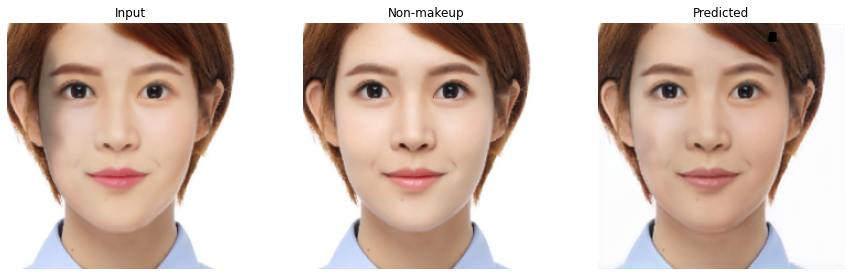

epoch: 29   loss: 0.0026535342913120985
-------- psnr_non:  25.952679 ----- epoch:  29   count:  16
epoch: 30   loss: 0.002481236821040511
-------- psnr_non:  26.241098 ----- epoch:  30   count:  16


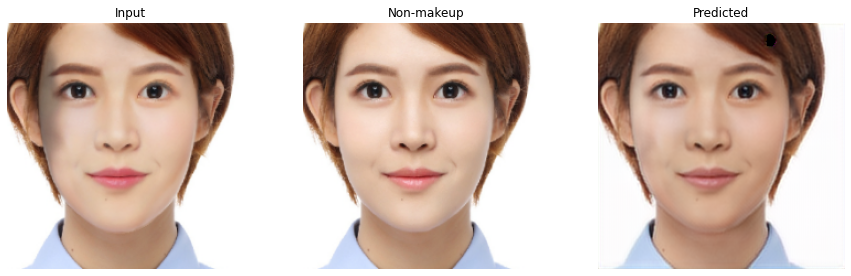

epoch: 31   loss: 0.002270500874146819
-------- psnr_non:  26.092976 ----- epoch:  31   count:  16
epoch: 32   loss: 0.002069522626698017
-------- psnr_non:  26.177061 ----- epoch:  32   count:  16
epoch: 33   loss: 0.0019839187152683735
-------- psnr_non:  26.154486 ----- epoch:  33   count:  16
epoch: 34   loss: 0.00188720365986228
-------- psnr_non:  26.093569 ----- epoch:  34   count:  16
epoch: 35   loss: 0.0017267464427277446
-------- psnr_non:  26.190775 ----- epoch:  35   count:  16
epoch: 36   loss: 0.0015940724406391382
-------- psnr_non:  26.229706 ----- epoch:  36   count:  16
epoch: 37   loss: 0.0015270537696778774
-------- psnr_non:  26.265358 ----- epoch:  37   count:  16


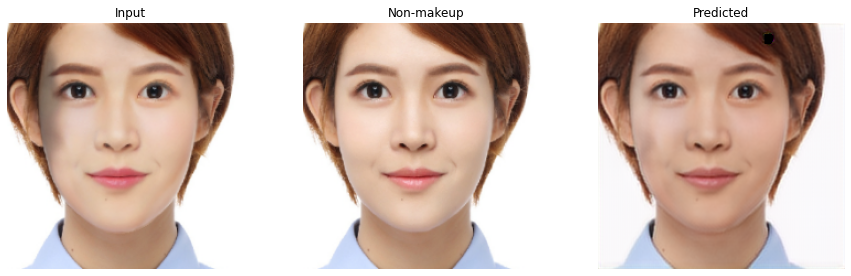

epoch: 38   loss: 0.0016234403010457754
-------- psnr_non:  26.252445 ----- epoch:  38   count:  16
epoch: 39   loss: 0.0014110964257270098
-------- psnr_non:  26.224638 ----- epoch:  39   count:  16
epoch: 40   loss: 0.0013361255405470729
-------- psnr_non:  26.304482 ----- epoch:  40   count:  16


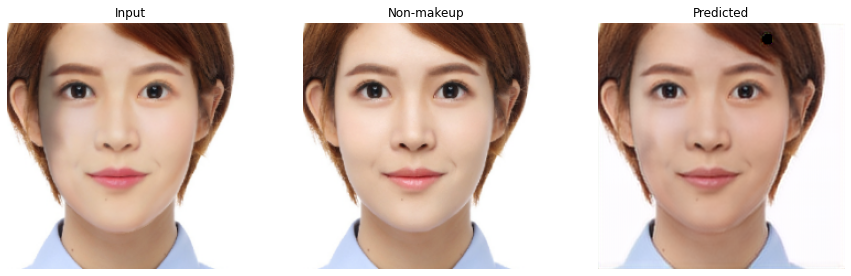

epoch: 41   loss: 0.0012448820052668452
-------- psnr_non:  26.281801 ----- epoch:  41   count:  16
epoch: 42   loss: 0.0011390033178031445
-------- psnr_non:  26.32447 ----- epoch:  42   count:  16


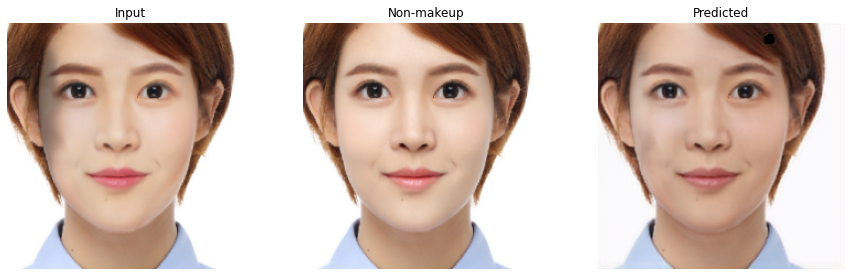

epoch: 43   loss: 0.0010692529613152146
-------- psnr_non:  26.292862 ----- epoch:  43   count:  16
epoch: 44   loss: 0.0010207518935203552
-------- psnr_non:  26.295914 ----- epoch:  44   count:  16
epoch: 45   loss: 0.0009682791423983872
-------- psnr_non:  26.322762 ----- epoch:  45   count:  16
epoch: 46   loss: 0.0009300931124016643
-------- psnr_non:  26.334166 ----- epoch:  46   count:  16


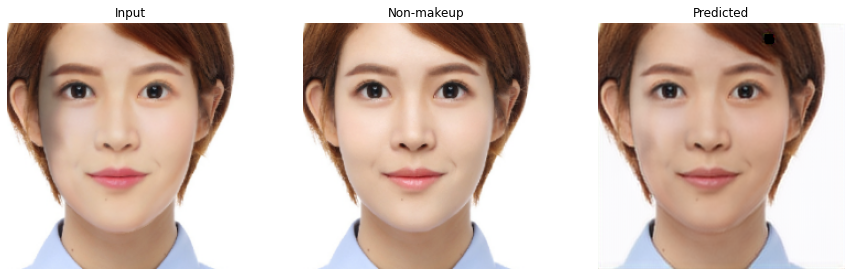

epoch: 47   loss: 0.0008956274832598865
-------- psnr_non:  26.314777 ----- epoch:  47   count:  16
epoch: 48   loss: 0.0008691076654940844
-------- psnr_non:  26.318834 ----- epoch:  48   count:  16
epoch: 49   loss: 0.0008405165281146765
-------- psnr_non:  26.316492 ----- epoch:  49   count:  16


In [ ]:
fit(res34Unet, train_dataset, EPOCHS, val_dataset)

In [ ]:
res34Unet.save('de_makeup_epochs_26_3psnr_epoch.h5')

In [ ]:
!mv /content/de_makeup_epochs_26_3psnr_epoch.h5 /content/drive/MyDrive

## Evaluate Results

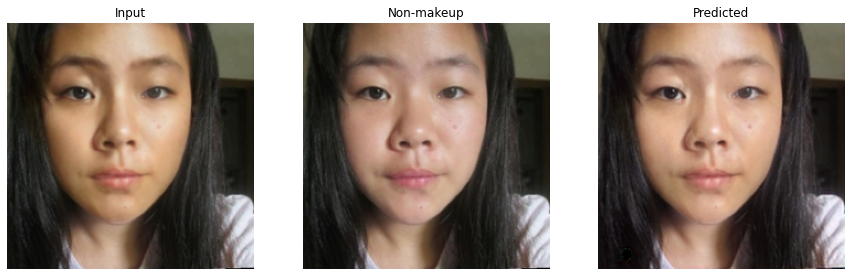

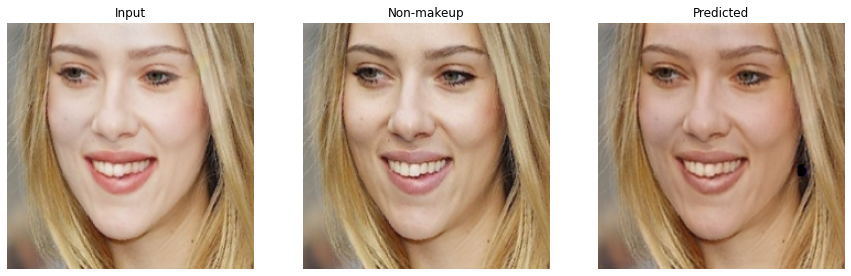

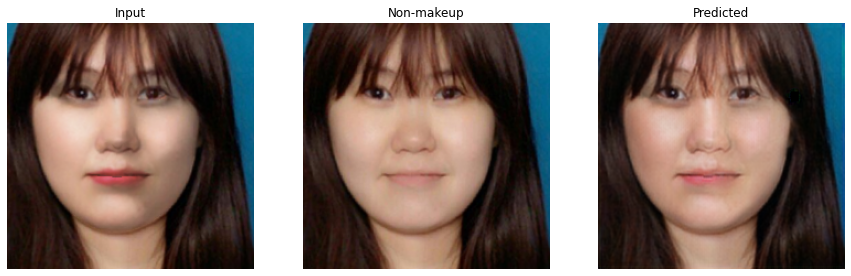

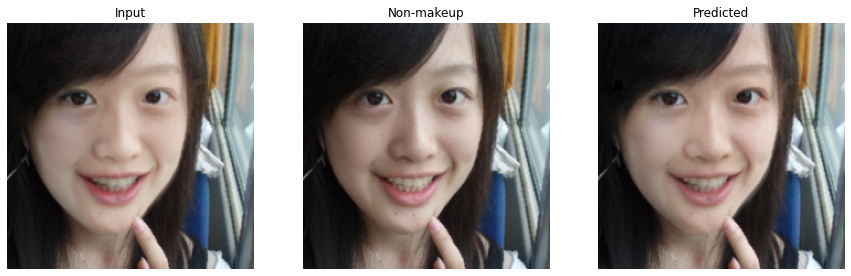

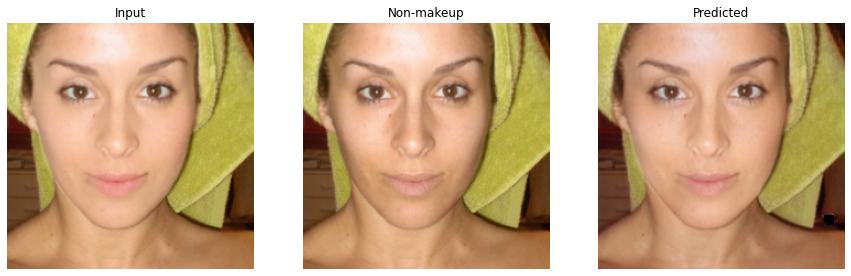

...

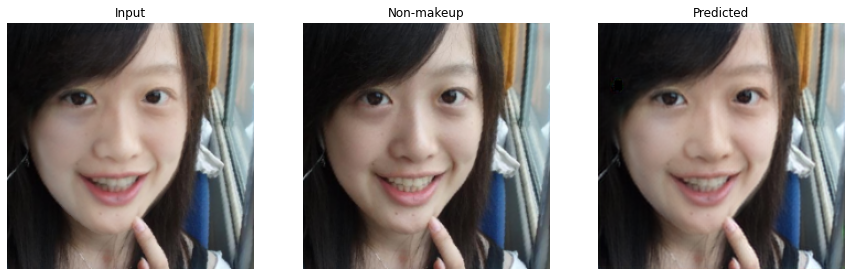

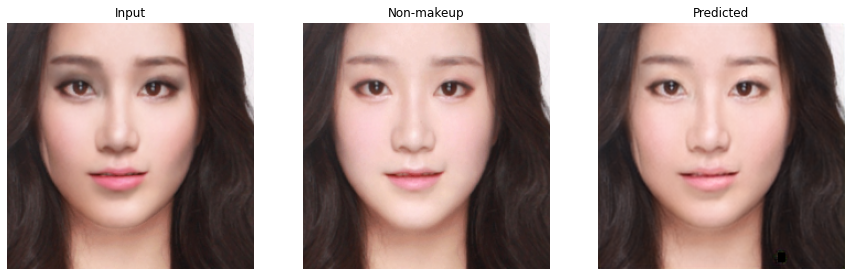

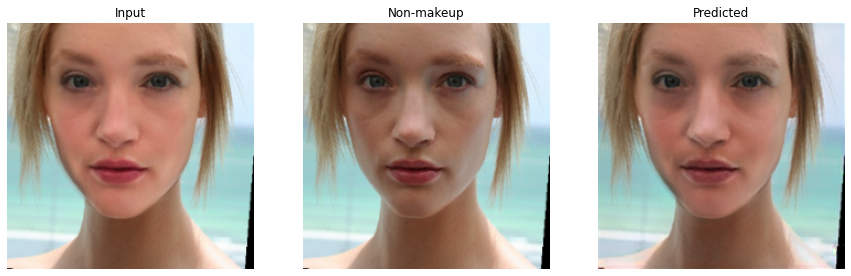

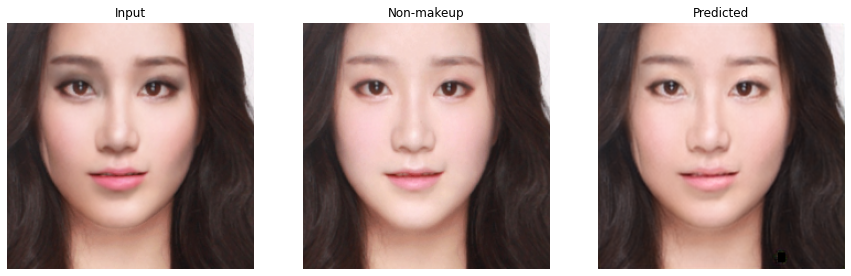

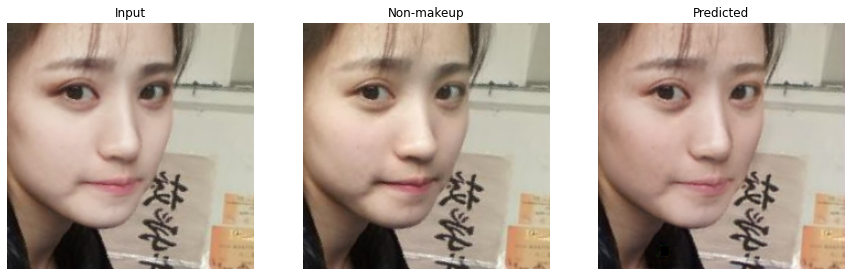

In [ ]:
for _ in range(50):
    for makeup_img, non_img in test_dataset.take(1):
        pred_non = res34Unet([makeup_img], training=False)
        plt.figure(figsize=(15,20))
        
        k = np.random.randint(0,BATCH_SIZE)
        display_list = [makeup_img[k], non_img[k], pred_non[k]]


        title = ['Input', 'Non-makeup', 'Predicted']    

        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i])
            plt.axis('off')
        plt.show()